In [9]:
import pennylane as qml
import torch
import numpy as np
import random
import torch.nn as nn
from tqdm import tqdm

In [10]:
import functools
import inspect
import math
from collections.abc import Iterable
from typing import Callable, Dict, Union, Any

from pennylane import QNode

try:
    import torch
    from torch.nn import Module

    TORCH_IMPORTED = True
except ImportError:
    # The following allows this module to be imported even if PyTorch is not installed. Users
    # will instead see an ImportError when instantiating the TorchLayer.
    from unittest.mock import Mock

    Module = Mock
    TORCH_IMPORTED = False


class TorchLayer(Module):
    def __init__(self,qnode,weights):
        if not TORCH_IMPORTED:
            raise ImportError(
                "TorchLayer requires PyTorch. PyTorch can be installed using:\n"
                "pip install torch\nAlternatively, "
                "visit https://pytorch.org/get-started/locally/ for detailed "
                "instructions."
            )
        super().__init__()

        #weight_shapes = {
        #    weight: (tuple(size) if isinstance(size, Iterable) else () if size == 1 else (size,))
        #    for weight, size in weight_shapes.items()
        #}

        # validate the QNode signature, and convert to a Torch QNode.
        # TODO: update the docstring regarding changes to restrictions when tape mode is default.
        #self._signature_validation(qnode, weight_shapes)
        self.qnode = qnode
        self.qnode.interface = "torch"

        self.qnode_weights = weights

    def forward(self, inputs):  # pylint: disable=arguments-differ
        """Evaluates a forward pass through the QNode based upon input data and the initialized
        weights.

        Args:
            inputs (tensor): data to be processed

        Returns:
            tensor: output data
        """

        if len(inputs.shape) > 1:
            # If the input size is not 1-dimensional, unstack the input along its first dimension,
            # recursively call the forward pass on each of the yielded tensors, and then stack the
            # outputs back into the correct shape
            reconstructor = [self.forward(x) for x in torch.unbind(inputs)]
            return torch.stack(reconstructor)

        # If the input is 1-dimensional, calculate the forward pass as usual
        return self._evaluate_qnode(inputs)


    def _evaluate_qnode(self, x):
        """Evaluates the QNode for a single input datapoint.

        Args:
            x (tensor): the datapoint

        Returns:
            tensor: output datapoint
        """
        kwargs = {
            **{self.input_arg: x},
            **{arg: weight.to(x) for arg, weight in self.qnode_weights.items()},
        }
        res = self.qnode(**kwargs)

        if isinstance(res, torch.Tensor):
            return res.type(x.dtype)

        return torch.hstack(res).type(x.dtype)

    def __str__(self):
        detail = "<Quantum Torch Layer: func={}>"
        return detail.format(self.qnode.func.__name__)

    __repr__ = __str__
    _input_arg = "inputs"

    @property
    def input_arg(self):
        """Name of the argument to be used as the input to the Torch layer. Set to ``"inputs"``."""
        return self._input_arg

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def visualize_attention(alpha, img_shape=(8,8), patch_shape=(64,64)):
    """
    alpha: Attention values (torch tensor or numpy array)
    img_shape: Shape of the original image (height, width)
    patch_shape: Shape of the patch (height, width)
    """
    # Reshape alpha to match image shape
    alpha = alpha.detach().numpy() if isinstance(alpha, torch.Tensor) else alpha
    attention_map = np.mean(alpha, axis=0).reshape(patch_shape)  # Mean over the sequence
    
    # Normalize the attention map
    attention_map = (attention_map - attention_map.min()) / (attention_map.max() - attention_map.min())
    
    # Plot the attention map
    plt.figure(figsize=(6, 6))
    sns.heatmap(attention_map, annot=True, cmap="YlGnBu", cbar=True)
    plt.title("Attention Map")
    plt.show()

In [12]:
class QSAL_pennylane(torch.nn.Module):
    def __init__(self,S,n,Denc,D):
        super().__init__()
        self.seq_num=S
        self.init_params_Q=torch.nn.Parameter(torch.stack([(np.pi/4) * (2 * torch.randn(n*(D+2)) - 1) for _ in range(self.seq_num)]))
        self.init_params_K=torch.nn.Parameter(torch.stack([(np.pi/4) * (2 * torch.randn(n*(D+2)) - 1) for _ in range(self.seq_num)]))
        self.init_params_V=torch.nn.Parameter(torch.stack([(np.pi/4) * (2 * torch.randn(n*(D+2)) - 1) for _ in range(self.seq_num)]))
        self.num_q=n
        self.Denc=Denc
        self.D=D
        self.d=n*(Denc+2)
        self.dev = qml.device("default.qubit", wires=self.num_q)
        
        self.vqnod=qml.QNode(self.circuit_v, self.dev, interface="torch")
        self.qnod=qml.QNode(self.circuit_qk, self.dev, interface="torch")
        self.weight_v = [{"weights": self.init_params_V[i]} for i in range(self.seq_num)]
        self.weight_q = [{"weights": self.init_params_Q[i]} for i in range(self.seq_num)]
        self.weight_k = [{"weights": self.init_params_K[i]} for i in range(self.seq_num)]
        #self.v_linear ={} #[qml.qnn.TorchLayer(self.vqnod[i], self.weight_shapes) for i in range(self.seq_num)]
        #for i in range(self.seq_num):
        self.v_linear = [TorchLayer(self.vqnod, self.weight_v[i]) for i in range(self.seq_num)]
        self.q_linear = [TorchLayer(self.qnod, self.weight_q[i]) for i in range(self.seq_num)]
        self.k_linear = [TorchLayer(self.qnod, self.weight_k[i]) for i in range(self.seq_num)]
        #self.qqnod=[qml.QNode(self.circuit_qk, self.dev, interface="torch") for i in range(self.seq_num)]

    def random_op(self):
        a=random.randint(0, 4)
        if a==0:
            op=qml.Identity(0)
        elif a==1:
            op=qml.PauliX(0)
        elif a==2:
            op=qml.PauliY(0)
        else:
            op=qml.PauliZ(0)

        op_elimated=qml.Identity(0)
        for i in range(1,self.num_q):
            op_elimated=op_elimated@qml.Identity(i)
        Select_wrong=True
        while Select_wrong:
            for i in range(1,self.num_q):
                a=random.randint(0, 4)
                if a==0:
                    op=op@qml.Identity(i)
                elif a==1:
                    op=op@qml.PauliX(i)
                elif a==2:
                    op=op@qml.PauliY(i)
                else:
                    op=op@qml.PauliZ(i)
            if op!=op_elimated:
                Select_wrong=False
        return op

    def circuit_v(self,inputs,weights):
            op=self.random_op()
            # feature_map
            indx=0
            for j in range(self.num_q):
                qml.RX(inputs[indx],j)
                qml.RY(inputs[indx+1],j)
                indx+=2
            for i in range(self.Denc):
                for j in range(self.num_q):
                    qml.CNOT(wires=(j,(j+1)%self.num_q))

                for j in range(self.num_q):
                    qml.RY(inputs[indx],j)
                    indx+=1
            # Ansatz
            indx=0
            for j in range(self.num_q):
                qml.RX(weights[indx],j)
                qml.RY(weights[indx+1],j)
                indx+=2
            for i in range(self.D):
                for j in range(self.num_q):
                    qml.CNOT(wires=(j,(j+1)%self.num_q))
                    
                for j in range(self.num_q):
                    #qc.rx(params[indx],j)
                    qml.RY(weights[indx],j)
                    indx+=1
            return [qml.expval(op) for i in range(self.d)] 

    def circuit_qk(self,inputs,weights):
        op=self.random_op()
        # feature_map
        indx=0
        for j in range(self.num_q):
            qml.RX(inputs[indx],j)
            qml.RY(inputs[indx+1],j)
            indx+=2
        for i in range(self.Denc):
            for j in range(self.num_q):
                qml.CNOT(wires=(j,(j+1)%self.num_q))

            for j in range(self.num_q):
                qml.RY(inputs[indx],j)
                indx+=1
        # Ansatz
        indx=0
        for j in range(self.num_q):
            qml.RX(weights[indx],j)
            qml.RY(weights[indx+1],j)
            indx+=2
        for i in range(self.D):
            for j in range(self.num_q):
                qml.CNOT(wires=(j,(j+1)%self.num_q))
                
            for j in range(self.num_q):
                #qc.rx(params[indx],j)
                qml.RY(weights[indx],j)
                indx+=1
        return [qml.expval(qml.PauliZ(0))]

    def forward(self,input):

        Q_output=torch.stack([self.q_linear[i](input[:,i]) for i in range(self.seq_num)])
        K_output=torch.stack([self.k_linear[i](input[:,i]) for i in range(self.seq_num)])
        V_output=torch.stack([self.v_linear[i](input[:,i]) for i in range(self.seq_num)])
        
        batch_size=len(input)
        Q_output=Q_output.transpose(0,2).repeat((self.seq_num,1,1))
        K_output=K_output.transpose(0,2).repeat((self.seq_num,1,1)).transpose(0,2)

        #print(V_output.size())
        #Q_grid, K_grid=torch.meshgrid(Q_output, K_output, indexing='ij')
        alpha=torch.exp(-(Q_output-K_output)**2)
        alpha=alpha.transpose(0,1)
        print(f'alpha: {alpha}')
        # Example usage:
        visualize_attention(alpha)
        V_output=V_output.transpose(0,1)
        output=[]
        
        print("Q_output size:", Q_output.size())
        print("K_output size:", K_output.size())
        print("V_output size:", V_output.size())


        for i in range(self.seq_num):
            
            Sum_a=torch.sum(alpha[:,i,:],-1)
            div_sum_a=(1/Sum_a).repeat(self.d,self.seq_num,1).transpose(0,2)
            
            Sum_w=torch.sum(alpha[:,:,i].repeat((self.d,1,1)).transpose(0,2).transpose(0,1)*V_output*div_sum_a,1)
            output.append(Sum_w)
        return input+torch.stack(output).transpose(0,1)


class QSANN_pennylane(torch.nn.Module):
    def __init__(self,S,n,Denc,D,num_layers):
        """
        # input: input data
        # weight: trainable parameter
        # n: # of of qubits
        # d: embedding dimension which is equal to n(Denc+2)
        # Denc: the # number of layers for encoding 
        # D: the # of layers of variational layers
        # type "K": key, "Q": Query, "V": value
        """
        super().__init__()
        self.qsal_lst=[QSAL_pennylane(S,n,Denc,D) for _ in range(num_layers)]
        self.qnn=nn.Sequential(*self.qsal_lst)

    def forward(self,input):
        return self.qnn(input)

class QSANN_text_classifier(torch.nn.Module):
    def __init__(self,S,n,Denc,D,num_layers):
        """
        # input: input data
        # weight: trainable parameter
        # n: # of of qubits
        # d: embedding dimension which is equal to n(Denc+2)
        # Denc: the # number of layers for encoding 
        # D: the # of layers of variational layers
        # type "K": key, "Q": Query, "V": value
        """
        super().__init__()
        self.Qnn=QSANN_pennylane(S,n,Denc,D,num_layers)
        self.final_layer=nn.Linear(n*(Denc+2)*S, 1)
        self.final_layer=self.final_layer.float()

    def forward(self,input):
        print(input.shape)
        x=self.Qnn(input)
        x=torch.flatten(x,start_dim=1)
        # print('done2')
        output = torch.sigmoid(self.final_layer(x))
        # print('done3')
        return output

In [46]:
from tensorflow.keras.datasets import cifar10
from sklearn.model_selection import train_test_split

# CIFAR-10 데이터 불러오기
(X_train_full, y_train_full), (X_test_full, y_test_full) = cifar10.load_data()

# 데이터 정규화 (0-255 값을 0-1 사이로)
X_train_full = X_train_full.astype('float32') / 255.0
X_test_full = X_test_full.astype('float32') / 255.0

# RGB -> Grayscale 변환
# 공식: 0.299*R + 0.587*G + 0.114*B
X_train_gray = np.dot(X_train_full[...,:3], [0.299, 0.587, 0.114])
X_test_gray = np.dot(X_test_full[...,:3], [0.299, 0.587, 0.114])

# 원하는 두 개의 클래스만 선택 (예: 클래스 0과 1)
selected_classes = [0, 1]

# 클래스 0과 1에 해당하는 데이터만 선택 (train set)
train_mask = np.isin(y_train_full, selected_classes)
X_train_filtered = X_train_gray[train_mask.squeeze()]
y_train_filtered = y_train_full[train_mask.squeeze()]

# 클래스 0과 1에 해당하는 데이터만 선택 (test set)
test_mask = np.isin(y_test_full, selected_classes)
X_test_filtered = X_test_gray[test_mask.squeeze()]
y_test_filtered = y_test_full[test_mask.squeeze()]

# 클래스 라벨을 이진 라벨로 변환 (0 또는 1로)
y_train_filtered = (y_train_filtered == selected_classes[1]).astype(int)
y_test_filtered = (y_test_filtered == selected_classes[1]).astype(int)

# 시드 고정
np.random.seed(42)

# 2000개의 데이터를 무작위로 선택
num_samples = 200
indices = np.random.choice(len(X_train_filtered), num_samples, replace=False)
X_sampled, y_sampled = X_train_filtered[indices], y_train_filtered[indices]

# 2000개의 샘플에서 train/test 데이터 분할 (80% train, 20% test 비율로 나눔)
X_train, X_test, y_train, y_test = train_test_split(
    X_sampled, y_sampled, test_size=0.2, random_state=42
)

y_train = y_train.squeeze(1)
y_test = y_test.squeeze(1)

# 결과 출력
print(f"Training set size: {len(X_train)}")
print(f"Test set size: {len(X_test)}")
print(f"Sampled train labels: {np.unique(y_train)}")
print(f"Sampled test labels: {np.unique(y_test)}")


Training set size: 160
Test set size: 40
Sampled train labels: [0 1]
Sampled test labels: [0 1]


In [47]:
# from sklearn.datasets import load_digits
# from sklearn.model_selection import train_test_split
# from sklearn.feature_extraction.image import extract_patches_2d

# digits = load_digits()
# X, y = digits.images, digits.target
# X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# train_mask = np.isin(y_train, [1, 7])
# X_train, y_train = X_train[train_mask], y_train[train_mask]

# test_mask = np.isin(y_test, [1, 7])
# X_test, y_test = X_test[test_mask], y_test[test_mask]

# #
# # X_train = X_train.reshape(X_train.shape[0], 16, 4)
# # X_test = X_test.reshape(X_test.shape[0], 16, 4)

In [48]:
X_train.shape

(160, 32, 32)

In [49]:
X_test.shape

(40, 32, 32)

In [51]:
# 2x2 크기로 겹치지 않게 패치로 나누는 함수
def split_into_non_overlapping_patches(image, patch_size=(4, 4)):
    patches = []
    for i in range(0, image.shape[0], patch_size[0]):
        for j in range(0, image.shape[1], patch_size[1]):
            patch = image[i:i+patch_size[0], j:j+patch_size[1]].flatten()
            patches.append(patch)
    return np.array(patches)

In [52]:
# 각 이미지를 2x2 겹치지 않는 패치로 나누기
X_train = np.array([split_into_non_overlapping_patches(img) for img in X_train])
X_test = np.array([split_into_non_overlapping_patches(img) for img in X_test])

In [53]:
# # (283, 16, 2, 2)를 (283, 16, 4)로 변환
# X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], -1)
# X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], -1)

In [54]:
# # 이미지 패치 나누기 (2x2 크기 패치)
# patch_size = (2, 2)

# # 각 이미지를 개별적으로 패치로 나누기
# X_train = np.array([extract_patches_2d(img, patch_size) for img in X_train])
# X_test = np.array([extract_patches_2d(img, patch_size) for img in X_test])

In [55]:
X_train.shape

(160, 64, 16)

In [56]:
X_train

array([[[0.68392943, 0.6815412 , 0.68497257, ..., 0.76893727,
         0.76659217, 0.78227844],
        [0.70445492, 0.67137649, 0.46515295, ..., 0.1654353 ,
         0.35371373, 0.76740001],
        [0.74089805, 0.73669805, 0.7232706 , ..., 0.77814511,
         0.7624157 , 0.51531373],
        ...,
        [0.42566667, 0.48869021, 0.51149413, ..., 0.61409022,
         0.60315296, 0.60198042],
        [0.55667454, 0.58433728, 0.61521963, ..., 0.60287453,
         0.61370198, 0.62340002],
        [0.6474863 , 0.65941963, 0.67676865, ..., 0.64737649,
         0.66540786, 0.67887845]],

       [[0.82471766, 0.83228236, 0.83741962, ..., 0.85775295,
         0.64949022, 0.18106275],
        [0.84296079, 0.84016864, 0.83373334, ..., 0.14673334,
         0.16343922, 0.39753334],
        [0.82356472, 0.82654903, 0.82840393, ..., 0.85992942,
         0.85500393, 0.85698432],
        ...,
        [0.5690314 , 0.90258432, 0.9450902 , ..., 0.27663531,
         0.27440001, 0.33927844],
        [0.9

In [57]:
    # def circuit_v(self,inputs,weights):
    #         op=self.random_op()
    #         # feature_map
    #         indx=0
    #         for j in range(self.num_q):
    #             qml.RX(inputs[indx],j)
    #             qml.RY(inputs[indx+1],j)
    #             indx+=2
    #         for i in range(self.Denc):
    #             for j in range(self.num_q):
    #                 qml.CNOT(wires=(j,(j+1)%self.num_q))

    #             for j in range(self.num_q):
    #                 qml.RY(inputs[indx],j)
    #                 indx+=1
    #         # Ansatz
    #         indx=0
    #         for j in range(self.num_q):
    #             qml.RX(weights[indx],j)
    #             qml.RY(weights[indx+1],j)
    #             indx+=2
    #         for i in range(self.D):
    #             for j in range(self.num_q):
    #                 qml.CNOT(wires=(j,(j+1)%self.num_q))
                    
    #             for j in range(self.num_q):
    #                 #qc.rx(params[indx],j)
    #                 qml.RY(weights[indx],j)
    #                 indx+=1
    #         return [qml.expval(op) for i in range(self.d)] 

In [58]:
model=QSANN_text_classifier(64, 4, 2, 1, 1)

# seq * (num_qubits) * (num_layers + 2)

In [59]:
optimizer = torch.optim.Adam(lr=0.01, params=model.parameters())

In [60]:
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(trainable_params)

3329


In [61]:
criterion = torch.nn.CrossEntropyLoss()

In [62]:
def binary_accuracy(preds, y):
    """
    Returns accuracy per batch, i.e. if you get 8/10 right, this returns 0.8, NOT 8
    """

    #round predictions to the closest integer
    rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2
    correct = (rounded_preds == y).float() #convert into float for division 
    acc = correct.sum() / len(correct)
    return acc

In [63]:
torch.tensor(X_train)

tensor([[[0.6839, 0.6815, 0.6850,  ..., 0.7689, 0.7666, 0.7823],
         [0.7045, 0.6714, 0.4652,  ..., 0.1654, 0.3537, 0.7674],
         [0.7409, 0.7367, 0.7233,  ..., 0.7781, 0.7624, 0.5153],
         ...,
         [0.4257, 0.4887, 0.5115,  ..., 0.6141, 0.6032, 0.6020],
         [0.5567, 0.5843, 0.6152,  ..., 0.6029, 0.6137, 0.6234],
         [0.6475, 0.6594, 0.6768,  ..., 0.6474, 0.6654, 0.6789]],

        [[0.8247, 0.8323, 0.8374,  ..., 0.8578, 0.6495, 0.1811],
         [0.8430, 0.8402, 0.8337,  ..., 0.1467, 0.1634, 0.3975],
         [0.8236, 0.8265, 0.8284,  ..., 0.8599, 0.8550, 0.8570],
         ...,
         [0.5690, 0.9026, 0.9451,  ..., 0.2766, 0.2744, 0.3393],
         [0.9179, 0.9178, 0.8760,  ..., 0.9317, 0.9329, 0.9254],
         [0.9438, 0.9573, 0.9261,  ..., 0.9387, 0.9122, 0.9198]],

        [[0.5241, 0.5218, 0.5280,  ..., 0.4737, 0.4737, 0.4569],
         [0.5285, 0.5251, 0.5133,  ..., 0.4346, 0.4362, 0.4452],
         [0.4899, 0.4664, 0.4507,  ..., 0.4428, 0.4350, 0.

  0%|          | 0/30 [00:00<?, ?it/s]

torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9140, 0.7020, 0.9650,  ..., 0.7318, 0.9859, 0.9991],
         [0.9373, 0.7394, 0.9797,  ..., 0.7682, 0.9946, 0.9943],
         [0.9096, 0.9998, 0.8390,  ..., 0.9976, 0.7876, 0.6658],
         ...,
         [0.9528, 0.7672, 0.9883,  ..., 0.7952, 0.9985, 0.9879],
         [0.8274, 0.5867, 0.9003,  ..., 0.6175, 0.9373, 0.9890],
         [0.8756, 0.9952, 0.7974,  ..., 0.9889, 0.7427, 0.6173]],

        [[0.9654, 0.7176, 0.9935,  ..., 0.8507, 0.9951, 0.7923],
         [0.9713, 0.7314, 0.9959,  ..., 0.8621, 0.9925, 0.8050],
         [0.9885, 0.9242, 0.9550,  ..., 0.9887, 0.8749, 0.9655],
         ...,
         [0.9322, 0.9849, 0.8708,  ..., 0.9975, 0.7608, 0.9991],
         [0.8558, 0.5416, 0.9205,  ..., 0.6900, 0.9814, 0.6215],
         [0.9368, 0.9825, 0.8769,  ..., 0.9983, 0.7683, 0.9985]],

        [[0.9053, 0.8675, 0.9408,  ..., 0.7891, 0.9048, 0.9860],
         [0.9635, 0.9829, 0.9342,  ..., 0.9995, 0.9638, 0.8594],
         [0.9656, 0.9401, 0.9860,  ..., 0.8795, 0.9

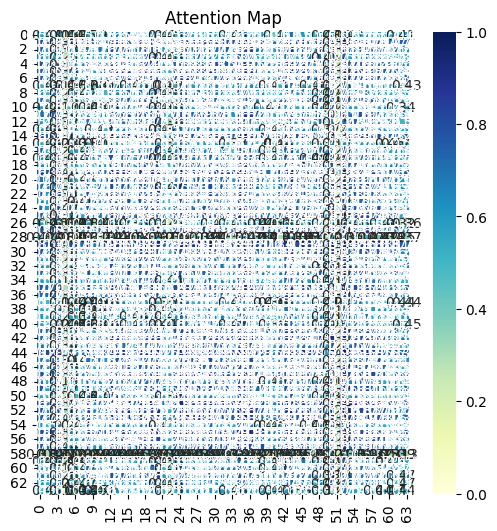

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.4187)

tensor(441.7205, grad_fn=<DivBackward1>)


  3%|▎         | 1/30 [14:59<7:14:43, 899.44s/it]

Complete 0 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9657, 0.9920, 0.8778,  ..., 0.9133, 0.9789, 0.9998],
         [0.9449, 0.9985, 0.8437,  ..., 0.9395, 0.9911, 0.9959],
         [0.8851, 0.9947, 0.7603,  ..., 0.9810, 0.9997, 0.9696],
         ...,
         [0.9742, 0.9870, 0.8932,  ..., 0.8991, 0.9712, 0.9999],
         [0.9898, 0.9699, 0.9269,  ..., 0.8612, 0.9479, 0.9948],
         [0.9404, 0.9992, 0.8368,  ..., 0.9440, 0.9928, 0.9945]],

        [[0.9561, 0.9707, 0.9533,  ..., 0.9998, 0.9920, 0.9857],
         [0.9977, 0.8293, 0.7952,  ..., 0.9418, 0.8849, 0.8654],
         [0.9740, 0.9519, 0.9307,  ..., 0.9988, 0.9809, 0.9717],
         ...,
         [0.8918, 0.9979, 0.9916,  ..., 0.9801, 0.9986, 1.0000],
         [0.9999, 0.8546, 0.8222,  ..., 0.9574, 0.9064, 0.8884],
         [0.9903, 0.9217, 0.8958,  ..., 0.9905, 0.9598, 0.9471]],

        [[0.9610, 0.9986, 0.8945,  ..., 0.9864, 0.9968, 0.9750],
         [0.9588, 0.8229, 0.9950,  ..., 0.9208, 0.8861, 0.7279],
         [0.7656, 0.9243, 0.6542,  ..., 0.8278, 0.8

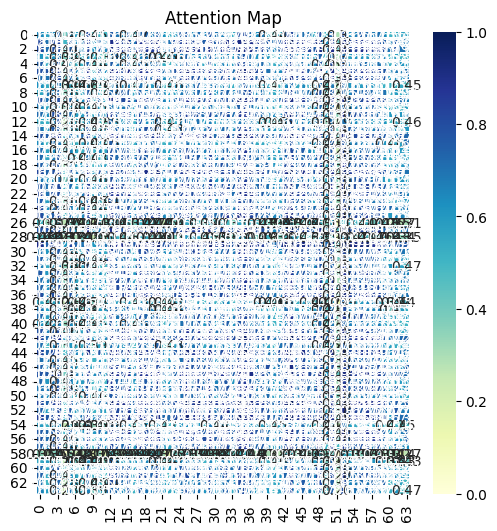

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.5437)

tensor(440.5496, grad_fn=<DivBackward1>)


  7%|▋         | 2/30 [34:13<8:09:38, 1049.23s/it]

Complete 1 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9992, 0.7632, 0.9663,  ..., 0.9304, 0.8221, 1.0000],
         [0.9981, 0.7758, 0.9603,  ..., 0.9381, 0.8336, 0.9998],
         [0.9128, 0.9414, 0.8098,  ..., 1.0000, 0.9720, 0.9295],
         ...,
         [0.9932, 0.8054, 0.9441,  ..., 0.9552, 0.8603, 0.9974],
         [0.8298, 0.9867, 0.7067,  ..., 0.9819, 0.9985, 0.8519],
         [0.9641, 0.5793, 0.9989,  ..., 0.7883, 0.6454, 0.9516]],

        [[0.9752, 0.7494, 0.9325,  ..., 0.9074, 0.9818, 0.9823],
         [0.9056, 0.9960, 0.9573,  ..., 0.9742, 0.8922, 0.8909],
         [0.9980, 0.8362, 0.9777,  ..., 0.9617, 0.9995, 0.9996],
         ...,
         [0.9165, 0.9931, 0.9647,  ..., 0.9800, 0.9037, 0.9024],
         [0.9965, 0.8258, 0.9732,  ..., 0.9559, 0.9987, 0.9988],
         [0.9964, 0.9036, 0.9979,  ..., 0.9914, 0.9931, 0.9928]],

        [[0.9097, 0.9908, 0.9174,  ..., 0.9317, 0.7359, 0.9712],
         [0.8866, 0.9967, 0.8951,  ..., 0.9111, 0.7036, 0.9568],
         [0.9986, 0.8739, 0.9995,  ..., 1.0000, 0.9

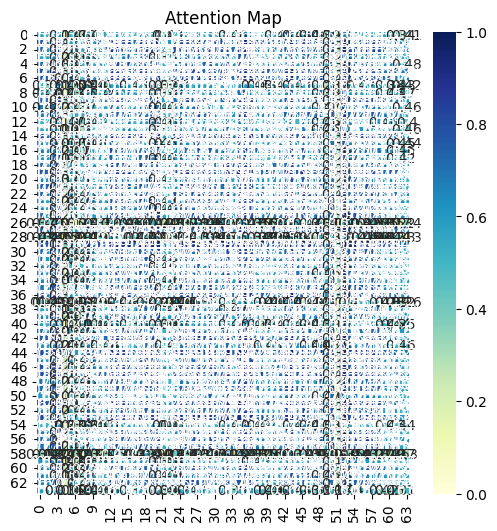

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.5437)

tensor(440.5249, grad_fn=<DivBackward1>)


 10%|█         | 3/30 [53:31<8:14:32, 1098.98s/it]

Complete 2 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9207, 0.6507, 0.8634,  ..., 0.9452, 0.9964, 0.9590],
         [0.9475, 0.9817, 0.9815,  ..., 0.9234, 0.8092, 0.9054],
         [0.8421, 0.9978, 0.9033,  ..., 0.8058, 0.6619, 0.7807],
         ...,
         [0.9661, 0.9673, 0.9919,  ..., 0.9460, 0.8429, 0.9304],
         [0.8711, 1.0000, 0.9268,  ..., 0.8372, 0.6983, 0.8135],
         [0.9473, 0.9818, 0.9814,  ..., 0.9232, 0.8090, 0.9052]],

        [[0.9966, 0.8877, 0.9727,  ..., 0.9888, 0.8737, 0.8683],
         [0.9878, 0.9180, 0.9532,  ..., 0.9972, 0.9057, 0.9008],
         [0.7745, 0.9896, 0.6861,  ..., 0.8900, 0.9936, 0.9949],
         ...,
         [0.9522, 0.9675, 0.8970,  ..., 0.9967, 0.9592, 0.9558],
         [0.8224, 0.9985, 0.7386,  ..., 0.9256, 0.9997, 0.9999],
         [0.6757, 0.9515, 0.5832,  ..., 0.8078, 0.9606, 0.9637]],

        [[0.9661, 0.9827, 0.9963,  ..., 0.9949, 1.0000, 0.9997],
         [0.9839, 0.9645, 1.0000,  ..., 0.9833, 0.9973, 0.9944],
         [0.9740, 0.9762, 0.9986,  ..., 0.9910, 0.9

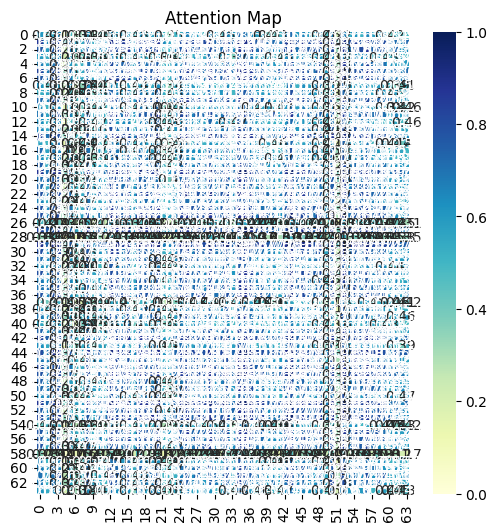

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.5437)

tensor(440.0954, grad_fn=<DivBackward1>)


 13%|█▎        | 4/30 [1:11:33<7:53:18, 1092.26s/it]

Complete 3 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9892, 0.9972, 0.6615,  ..., 0.9471, 0.8716, 0.9931],
         [0.8357, 0.9315, 0.9008,  ..., 0.9925, 0.9974, 0.9457],
         [0.8328, 0.9294, 0.9032,  ..., 0.9918, 0.9978, 0.9439],
         ...,
         [0.5578, 0.6920, 0.9997,  ..., 0.8334, 0.9197, 0.7171],
         [0.8058, 0.9098, 0.9234,  ..., 0.9838, 0.9999, 0.9260],
         [0.9982, 0.9869, 0.6087,  ..., 0.9168, 0.8294, 0.9792]],

        [[0.8741, 0.4836, 0.4568,  ..., 0.9441, 0.8105, 0.3849],
         [0.8816, 0.9831, 0.9737,  ..., 0.7926, 0.9329, 0.9369],
         [0.7918, 1.0000, 0.9988,  ..., 0.6891, 0.8578, 0.9839],
         ...,
         [0.9854, 0.8757, 0.8540,  ..., 0.9403, 0.9991, 0.7871],
         [0.8939, 0.9776, 0.9669,  ..., 0.8079, 0.9425, 0.9269],
         [0.8878, 0.5018, 0.4746,  ..., 0.9536, 0.8266, 0.4015]],

        [[0.9812, 0.9929, 0.9960,  ..., 0.9407, 0.9231, 0.9396],
         [0.9997, 0.9448, 0.9538,  ..., 0.9913, 0.9835, 0.9909],
         [0.9949, 0.9778, 0.9834,  ..., 0.9676, 0.9

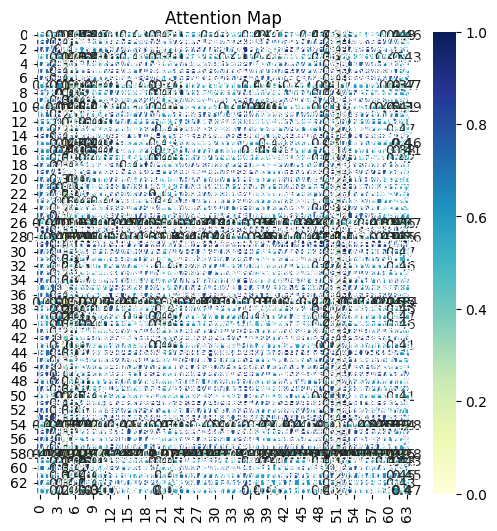

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.5688)

tensor(438.4004, grad_fn=<DivBackward1>)


 17%|█▋        | 5/30 [1:27:05<7:11:00, 1034.43s/it]

Complete 4 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.8257, 0.6482, 0.5080,  ..., 0.6381, 0.4270, 0.7593],
         [0.9998, 0.9459, 0.8519,  ..., 0.9405, 0.7789, 0.9896],
         [0.9993, 0.9628, 0.8790,  ..., 0.9583, 0.8102, 0.9963],
         ...,
         [0.9903, 0.9852, 0.9211,  ..., 0.9822, 0.8615, 0.9999],
         [0.9894, 0.9862, 0.9234,  ..., 0.9833, 0.8643, 0.9997],
         [0.8823, 0.7188, 0.5790,  ..., 0.7090, 0.4949, 0.8233]],

        [[0.9907, 0.9279, 0.9513,  ..., 0.8144, 0.9655, 0.9712],
         [0.8726, 0.9638, 0.9430,  ..., 0.9998, 0.9254, 0.9167],
         [0.9831, 0.9978, 1.0000,  ..., 0.9503, 0.9984, 0.9968],
         ...,
         [0.8821, 0.9691, 0.9497,  ..., 1.0000, 0.9329, 0.9246],
         [0.8959, 0.9764, 0.9590,  ..., 0.9994, 0.9436, 0.9359],
         [0.9970, 0.9851, 0.9948,  ..., 0.9129, 0.9987, 0.9996]],

        [[0.9964, 0.9585, 0.7234,  ..., 0.9978, 0.9907, 0.9948],
         [0.8491, 0.9810, 0.9509,  ..., 0.9152, 0.8231, 0.8403],
         [0.9452, 0.9992, 0.8579,  ..., 0.9831, 0.9

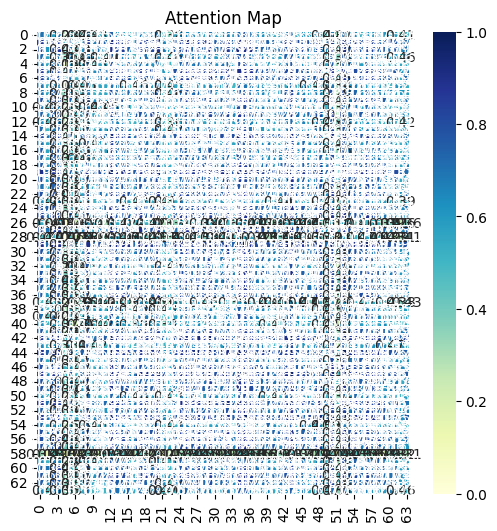

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.6812)

tensor(434.2444, grad_fn=<DivBackward1>)


 20%|██        | 6/30 [1:42:35<6:39:34, 998.95s/it] 

Complete 5 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9465, 0.9911, 0.8351,  ..., 0.9320, 0.9883, 0.9811],
         [0.7820, 0.9725, 0.6247,  ..., 1.0000, 0.9769, 0.8525],
         [0.8326, 0.9902, 0.6824,  ..., 0.9949, 0.9928, 0.8958],
         ...,
         [0.5528, 0.8232, 0.3979,  ..., 0.9297, 0.8333, 0.6353],
         [0.9859, 0.9571, 0.9087,  ..., 0.8652, 0.9513, 0.9995],
         [0.8952, 1.0000, 0.7609,  ..., 0.9724, 0.9999, 0.9457]],

        [[0.9595, 0.8957, 0.9746,  ..., 0.9810, 0.9865, 0.9844],
         [0.9843, 0.9373, 0.9931,  ..., 0.9963, 0.9630, 0.9596],
         [0.9346, 0.8598, 0.9539,  ..., 0.9625, 0.9964, 0.9953],
         ...,
         [0.9946, 0.9970, 0.9865,  ..., 0.9810, 0.8564, 0.8504],
         [0.9284, 0.8514, 0.9486,  ..., 0.9577, 0.9978, 0.9968],
         [0.8863, 0.9533, 0.8588,  ..., 0.8439, 0.6407, 0.6331]],

        [[0.7347, 0.9900, 0.6915,  ..., 0.8667, 0.6125, 0.8233],
         [0.9882, 0.8872, 0.9744,  ..., 0.9954, 0.9375, 1.0000],
         [1.0000, 0.8089, 0.9978,  ..., 0.9672, 0.9

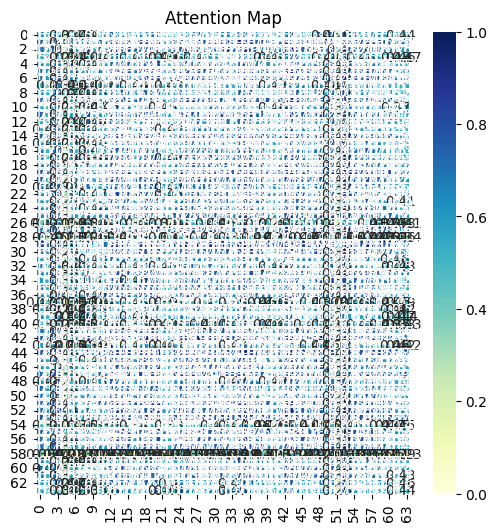

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.5813)

tensor(435.5799, grad_fn=<DivBackward1>)


 23%|██▎       | 7/30 [1:58:18<6:15:55, 980.69s/it]

Complete 6 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.7055, 0.9134, 0.5562,  ..., 0.9965, 0.9914, 0.9453],
         [0.7223, 0.9020, 0.5734,  ..., 0.9985, 0.9872, 0.9540],
         [0.6741, 0.9329, 0.5245,  ..., 0.9907, 0.9969, 0.9274],
         ...,
         [0.8681, 0.7668, 0.7378,  ..., 0.9762, 0.9097, 0.9995],
         [0.5650, 0.9817, 0.4203,  ..., 0.9510, 0.9949, 0.8507],
         [0.9974, 0.4116, 0.9846,  ..., 0.7125, 0.5831, 0.8493]],

        [[0.9699, 0.9954, 0.8880,  ..., 0.9895, 0.9244, 0.9840],
         [0.9955, 0.9084, 0.9896,  ..., 0.8878, 0.9985, 0.8727],
         [0.9991, 0.9560, 0.9606,  ..., 0.9408, 0.9816, 0.9291],
         ...,
         [0.9835, 0.9872, 0.9145,  ..., 0.9782, 0.9464, 0.9707],
         [0.9779, 0.9913, 0.9031,  ..., 0.9837, 0.9371, 0.9771],
         [0.9224, 0.9983, 0.8137,  ..., 1.0000, 0.8591, 0.9997]],

        [[0.8760, 0.7664, 0.8724,  ..., 0.6713, 0.6049, 0.7998],
         [0.9814, 0.9199, 0.9799,  ..., 0.8491, 0.7925, 0.9413],
         [0.9472, 0.9935, 0.9496,  ..., 0.9988, 0.9

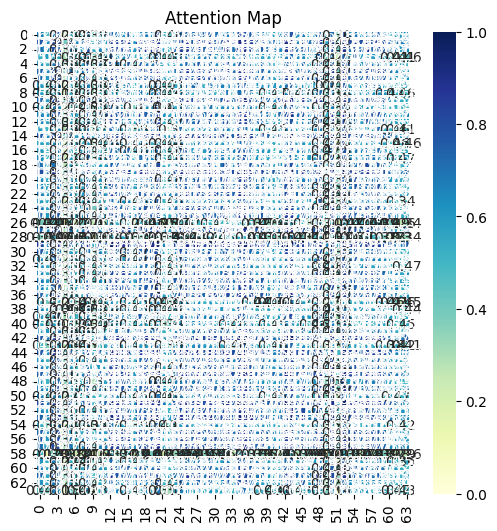

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.5625)

tensor(435.8875, grad_fn=<DivBackward1>)


 27%|██▋       | 8/30 [2:13:54<5:54:22, 966.47s/it]

Complete 7 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.8770, 0.8861, 0.9963,  ..., 0.9981, 0.9533, 0.6537],
         [0.7191, 0.7311, 0.9774,  ..., 0.9367, 1.0000, 0.4741],
         [0.9477, 0.9540, 0.9640,  ..., 0.9925, 0.8851, 0.7620],
         ...,
         [0.9638, 0.9582, 0.6849,  ..., 0.7704, 0.5500, 0.9905],
         [0.5624, 0.5748, 0.8935,  ..., 0.8239, 0.9690, 0.3332],
         [0.9979, 0.9963, 0.8022,  ..., 0.8753, 0.6746, 0.9425]],

        [[0.5427, 0.5915, 0.8791,  ..., 0.8214, 0.8610, 0.6866],
         [0.9821, 0.9940, 0.9202,  ..., 0.9593, 0.9344, 0.9988],
         [0.7859, 0.8285, 0.9954,  ..., 0.9769, 0.9908, 0.9013],
         ...,
         [0.8893, 0.9218, 0.9936,  ..., 1.0000, 0.9973, 0.9702],
         [0.9528, 0.9738, 0.9597,  ..., 0.9861, 0.9699, 0.9974],
         [0.6619, 0.7100, 0.9529,  ..., 0.9116, 0.9406, 0.7989]],

        [[0.9894, 0.9947, 0.6521,  ..., 1.0000, 0.9767, 0.9993],
         [0.9785, 0.9864, 0.6143,  ..., 0.9981, 0.9881, 0.9997],
         [0.9451, 0.9307, 0.9066,  ..., 0.8898, 0.7

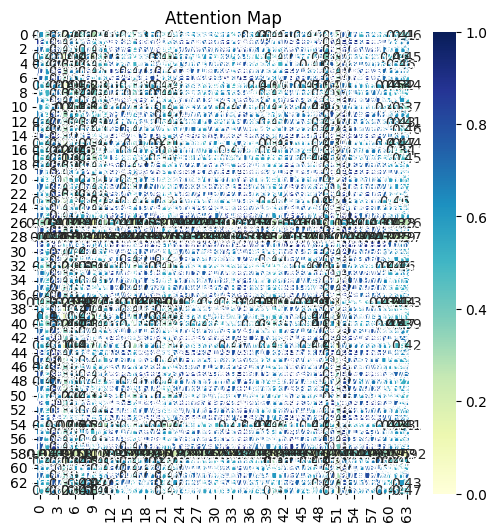

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.6812)

tensor(432.9164, grad_fn=<DivBackward1>)


 30%|███       | 9/30 [2:29:31<5:35:01, 957.21s/it]

Complete 8 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9997, 0.9970, 0.9431,  ..., 0.8048, 0.9971, 0.9955],
         [0.9867, 0.9981, 0.8906,  ..., 0.7271, 0.9771, 0.9728],
         [0.9988, 0.9888, 0.9644,  ..., 0.8422, 1.0000, 0.9997],
         ...,
         [0.9804, 0.9558, 0.9930,  ..., 0.9095, 0.9892, 0.9918],
         [0.9993, 0.9980, 0.9386,  ..., 0.7973, 0.9960, 0.9940],
         [0.8160, 0.7610, 0.9501,  ..., 1.0000, 0.8421, 0.8517]],

        [[0.9601, 0.9226, 0.9987,  ..., 0.9992, 0.8849, 0.9538],
         [0.8645, 0.8065, 0.9546,  ..., 0.9775, 0.7556, 0.9986],
         [0.9658, 0.9304, 0.9996,  ..., 0.9980, 0.8943, 0.9472],
         ...,
         [0.8781, 0.8221, 0.9629,  ..., 0.9833, 0.7723, 0.9965],
         [0.9034, 0.8515, 0.9770,  ..., 0.9923, 0.8044, 0.9899],
         [0.9426, 0.8997, 0.9941,  ..., 0.9998, 0.8584, 0.9694]],

        [[0.8948, 0.9338, 0.9920,  ..., 0.9810, 0.9261, 0.9930],
         [0.9989, 0.9985, 0.8593,  ..., 0.9743, 0.9995, 0.9544],
         [0.5519, 0.6131, 0.8858,  ..., 0.7176, 0.6

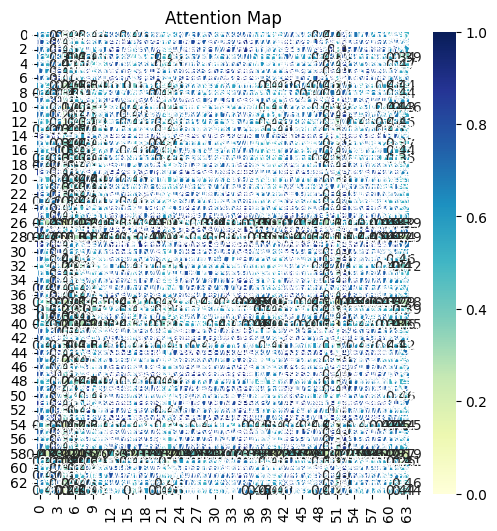

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.7312)

tensor(432.0814, grad_fn=<DivBackward1>)


 33%|███▎      | 10/30 [2:45:24<5:18:39, 955.98s/it]

Complete 9 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.8402, 0.7129, 0.7600,  ..., 0.9180, 0.9075, 0.7048],
         [0.9725, 0.8961, 0.9280,  ..., 0.9982, 0.9963, 0.8902],
         [1.0000, 0.9718, 0.9877,  ..., 0.9857, 0.9898, 0.9685],
         ...,
         [0.9522, 0.9968, 0.9869,  ..., 0.8872, 0.8986, 0.9978],
         [0.9993, 0.9645, 0.9827,  ..., 0.9902, 0.9936, 0.9608],
         [0.9501, 0.8585, 0.8952,  ..., 0.9898, 0.9856, 0.8519]],

        [[0.9715, 0.9987, 0.9554,  ..., 0.9459, 0.7743, 0.8116],
         [0.9635, 0.9998, 0.9456,  ..., 0.9352, 0.7561, 0.7942],
         [0.9788, 0.9964, 0.9646,  ..., 0.9560, 0.7926, 0.8288],
         ...,
         [0.9252, 0.7904, 0.9462,  ..., 0.9557, 0.9968, 0.9999],
         [0.9628, 0.8515, 0.9774,  ..., 0.9836, 0.9803, 0.9915],
         [0.5646, 0.3961, 0.6019,  ..., 0.6211, 0.8381, 0.8025]],

        [[0.9983, 0.9344, 0.9341,  ..., 0.9054, 0.8477, 0.9744],
         [0.9489, 0.9948, 0.8174,  ..., 0.9840, 0.9534, 0.9993],
         [0.9898, 0.9607, 0.9019,  ..., 0.9371, 0.8

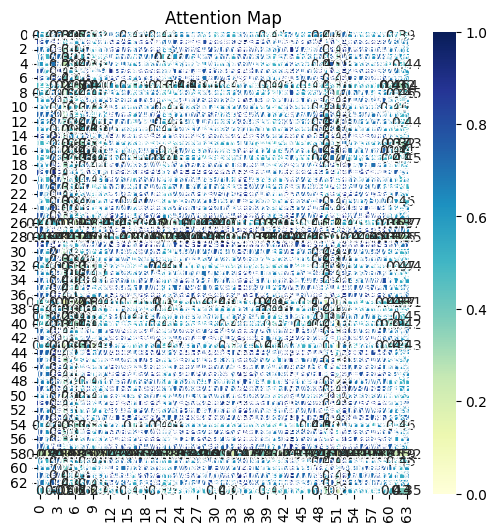

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.6750)

tensor(433.2241, grad_fn=<DivBackward1>)


 37%|███▋      | 11/30 [3:02:09<5:07:28, 970.98s/it]

Complete 10 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9959, 0.8820, 0.9330,  ..., 0.9317, 0.9894, 0.8308],
         [0.6993, 0.9683, 0.9295,  ..., 0.9308, 0.8309, 0.9894],
         [0.9617, 0.9523, 0.9832,  ..., 0.9825, 0.9991, 0.9155],
         ...,
         [0.8633, 0.9988, 0.9969,  ..., 0.9972, 0.9545, 0.9877],
         [0.8346, 1.0000, 0.9905,  ..., 0.9910, 0.9358, 0.9952],
         [0.6475, 0.9437, 0.8958,  ..., 0.8974, 0.7853, 0.9733]],

        [[0.8384, 0.7281, 0.8816,  ..., 0.8955, 0.9718, 0.8187],
         [0.9764, 0.9150, 0.9920,  ..., 0.9955, 0.9908, 0.9674],
         [0.8257, 0.7135, 0.8703,  ..., 0.8847, 0.9656, 0.8055],
         ...,
         [0.9993, 0.9716, 0.9985,  ..., 0.9962, 0.9509, 0.9971],
         [0.9101, 0.8164, 0.9431,  ..., 0.9530, 0.9968, 0.8942],
         [0.9999, 0.9822, 0.9945,  ..., 0.9906, 0.9347, 0.9997]],

        [[0.9990, 0.9966, 0.9949,  ..., 0.9570, 0.9803, 0.9371],
         [0.9932, 0.9883, 0.9995,  ..., 0.9348, 0.9641, 0.9589],
         [0.9997, 0.9981, 0.9925,  ..., 0.9629, 0.9

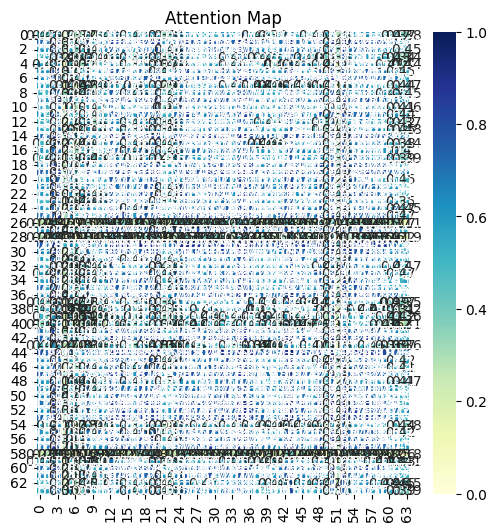

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.6875)

tensor(432.4181, grad_fn=<DivBackward1>)


 40%|████      | 12/30 [3:18:55<4:54:29, 981.65s/it]

Complete 11 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9920, 0.8101, 0.9987,  ..., 0.8481, 0.9204, 0.5432],
         [0.7681, 0.9988, 0.8602,  ..., 0.9997, 0.9817, 0.8801],
         [0.7208, 0.9995, 0.8192,  ..., 0.9942, 0.9629, 0.9145],
         ...,
         [0.9709, 0.8677, 0.9979,  ..., 0.9005, 0.9585, 0.6134],
         [0.9817, 0.8433, 0.9999,  ..., 0.8786, 0.9432, 0.5825],
         [0.8707, 0.9693, 0.9410,  ..., 0.9848, 1.0000, 0.7797]],

        [[0.9142, 0.8528, 0.7224,  ..., 0.8035, 0.8483, 0.9896],
         [0.9848, 0.9514, 0.8559,  ..., 0.9183, 0.9485, 0.9946],
         [0.9723, 0.9954, 0.9894,  ..., 1.0000, 0.9962, 0.8753],
         ...,
         [0.9999, 0.9881, 0.9243,  ..., 0.9688, 0.9867, 0.9655],
         [0.9828, 0.9479, 0.8504,  ..., 0.9140, 0.9450, 0.9957],
         [0.6676, 0.7501, 0.8753,  ..., 0.8037, 0.7554, 0.4997]],

        [[0.6543, 0.8373, 0.4637,  ..., 0.9165, 0.9313, 0.8086],
         [0.9816, 0.9913, 0.8774,  ..., 0.9528, 0.9403, 0.9971],
         [0.9038, 0.9922, 0.7443,  ..., 0.9986, 0.9

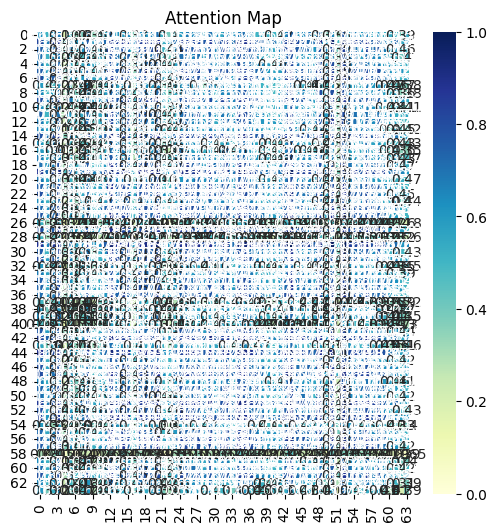

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.7688)

tensor(430.4228, grad_fn=<DivBackward1>)


 43%|████▎     | 13/30 [3:36:13<4:42:56, 998.64s/it]

Complete 12 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9892, 0.9365, 0.9959,  ..., 0.9027, 0.9778, 0.7608],
         [0.8641, 0.7518, 0.9552,  ..., 0.6995, 0.9837, 0.5266],
         [0.9462, 0.8608, 0.9955,  ..., 0.8160, 0.9996, 0.6521],
         ...,
         [0.9961, 0.9552, 0.9889,  ..., 0.9257, 0.9638, 0.7936],
         [0.9680, 0.9992, 0.8858,  ..., 0.9987, 0.8281, 0.9448],
         [0.9301, 0.8374, 0.9898,  ..., 0.7904, 0.9998, 0.6230]],

        [[0.9394, 0.5062, 0.9826,  ..., 0.7497, 0.9043, 0.7893],
         [0.7879, 0.9925, 0.6928,  ..., 0.9602, 0.8375, 0.9386],
         [0.8448, 0.9733, 0.7565,  ..., 0.9848, 0.8887, 0.9701],
         ...,
         [0.6842, 0.9983, 0.5837,  ..., 0.8972, 0.7398, 0.8658],
         [0.9025, 0.9371, 0.8254,  ..., 0.9989, 0.9379, 0.9930],
         [0.9912, 0.6391, 0.9994,  ..., 0.8652, 0.9744, 0.8966]],

        [[0.7309, 0.9613, 0.9602,  ..., 0.9406, 0.9959, 0.9487],
         [0.9579, 0.7379, 0.7355,  ..., 0.6976, 0.9200, 0.7125],
         [0.6588, 0.9874, 0.9867,  ..., 0.9743, 0.9

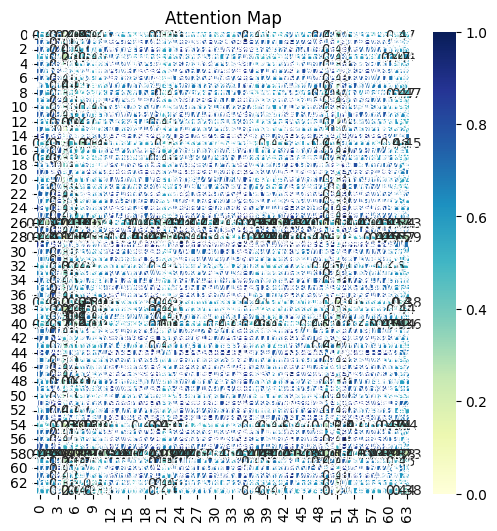

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.7375)

tensor(430.0849, grad_fn=<DivBackward1>)


 47%|████▋     | 14/30 [3:53:41<4:30:14, 1013.42s/it]

Complete 13 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9958, 0.7557, 0.9009,  ..., 0.9752, 0.9450, 0.5410],
         [0.9864, 0.8863, 0.9803,  ..., 0.8905, 0.8384, 0.6961],
         [0.9999, 0.8002, 0.9317,  ..., 0.9545, 0.9166, 0.5898],
         ...,
         [0.9523, 0.9424, 0.9986,  ..., 0.8209, 0.7603, 0.7802],
         [0.8820, 0.9879, 0.9908,  ..., 0.7163, 0.6495, 0.8754],
         [0.9949, 0.7504, 0.8970,  ..., 0.9772, 0.9479, 0.5354]],

        [[0.9922, 0.8373, 1.0000,  ..., 0.9642, 0.9311, 0.7376],
         [0.9931, 0.8335, 0.9999,  ..., 0.9622, 0.9284, 0.7332],
         [0.9141, 0.9567, 0.9577,  ..., 0.9996, 0.9969, 0.8905],
         ...,
         [0.9603, 0.9091, 0.9881,  ..., 0.9939, 0.9764, 0.8247],
         [0.9930, 0.8337, 0.9999,  ..., 0.9623, 0.9285, 0.7335],
         [0.9764, 0.6428, 0.9410,  ..., 0.8280, 0.7706, 0.5315]],

        [[0.9909, 0.9397, 0.8915,  ..., 0.9887, 0.9734, 0.9989],
         [0.9813, 0.9997, 0.9888,  ..., 0.9841, 0.8540, 0.9314],
         [0.9998, 0.9809, 0.9491,  ..., 1.0000, 0.9

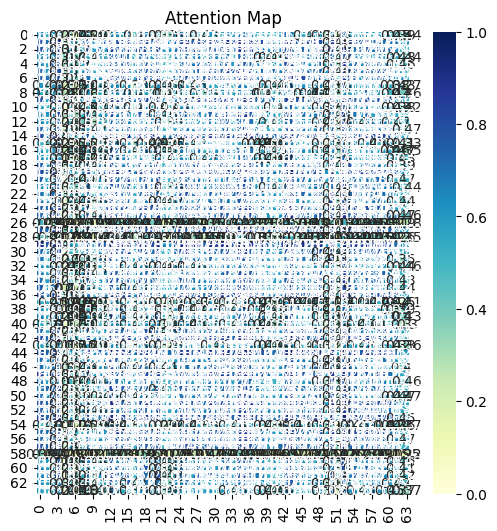

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.7312)

tensor(430.6817, grad_fn=<DivBackward1>)


 50%|█████     | 15/30 [4:10:52<4:14:40, 1018.72s/it]

Complete 14 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9797, 0.8870, 0.9453,  ..., 0.8884, 0.9718, 1.0000],
         [0.9934, 0.8467, 0.9146,  ..., 0.8483, 0.9886, 0.9954],
         [0.7721, 0.9996, 0.9837,  ..., 0.9995, 0.7516, 0.8791],
         ...,
         [0.7338, 0.9955, 0.9695,  ..., 0.9952, 0.7126, 0.8476],
         [0.7183, 0.9927, 0.9627,  ..., 0.9923, 0.6968, 0.8343],
         [0.9479, 0.9355, 0.9780,  ..., 0.9366, 0.9361, 0.9934]],

        [[0.9327, 0.9463, 1.0000,  ..., 0.9376, 0.9890, 0.9524],
         [0.9641, 0.9740, 0.9941,  ..., 0.9677, 0.9989, 0.9174],
         [0.8001, 0.8216, 0.9592,  ..., 0.8077, 0.9064, 0.9998],
         ...,
         [0.8447, 0.8644, 0.9798,  ..., 0.8517, 0.9385, 0.9945],
         [0.7530, 0.7759, 0.9324,  ..., 0.7611, 0.8695, 0.9977],
         [0.4069, 0.4295, 0.6296,  ..., 0.4148, 0.5362, 0.8067]],

        [[0.9873, 0.9902, 0.9959,  ..., 0.9327, 0.9650, 0.9649],
         [0.8841, 0.9809, 0.9128,  ..., 0.7772, 0.8334, 0.9976],
         [0.9923, 0.9140, 0.9815,  ..., 0.9960, 0.9

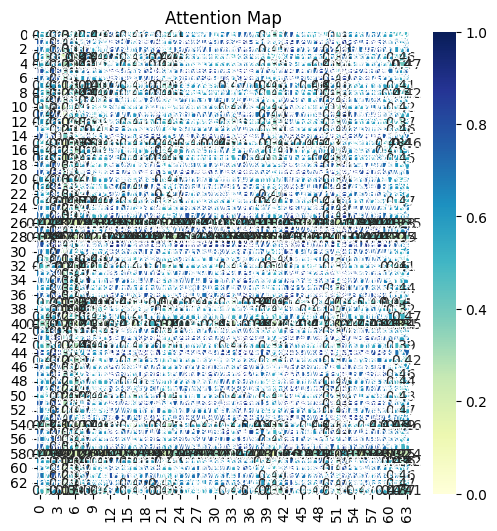

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.7750)

tensor(429.5142, grad_fn=<DivBackward1>)


 53%|█████▎    | 16/30 [4:27:31<3:56:20, 1012.88s/it]

Complete 15 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9887, 0.9736, 0.7161,  ..., 0.9856, 0.9658, 0.9951],
         [0.9475, 0.9696, 0.9445,  ..., 0.8097, 0.9770, 0.8457],
         [0.9849, 0.9956, 0.8860,  ..., 0.8845, 0.9981, 0.9138],
         ...,
         [0.8254, 0.7829, 0.4375,  ..., 0.9565, 0.7647, 0.9342],
         [0.9917, 0.9988, 0.8658,  ..., 0.9034, 0.9999, 0.9304],
         [0.6802, 0.6319, 0.3035,  ..., 0.8564, 0.6121, 0.8213]],

        [[0.6848, 0.6620, 0.6829,  ..., 0.7798, 0.9358, 0.6674],
         [0.9667, 0.9756, 0.9675,  ..., 0.9135, 0.7456, 0.9736],
         [0.9802, 0.9870, 0.9808,  ..., 0.9356, 0.7795, 0.9855],
         ...,
         [0.9906, 0.9847, 0.9902,  ..., 0.9996, 0.9344, 0.9862],
         [0.9491, 0.9368, 0.9482,  ..., 0.9876, 0.9835, 0.9398],
         [0.9767, 0.9679, 0.9760,  ..., 0.9986, 0.9592, 0.9701]],

        [[0.9551, 0.9966, 0.9963,  ..., 0.9034, 0.9554, 0.9650],
         [0.9696, 0.9996, 0.9901,  ..., 0.9247, 0.9383, 0.9778],
         [0.9239, 0.9845, 1.0000,  ..., 0.8618, 0.9

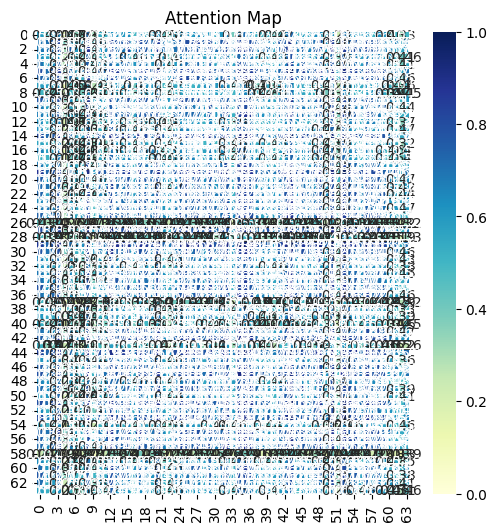

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.7937)

tensor(428.4357, grad_fn=<DivBackward1>)


 57%|█████▋    | 17/30 [4:44:54<3:41:25, 1021.97s/it]

Complete 16 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.6739, 0.7792, 0.9181,  ..., 0.8928, 0.8839, 0.6212],
         [0.9155, 0.9720, 0.9985,  ..., 1.0000, 0.9996, 0.8792],
         [0.9997, 0.9786, 0.8821,  ..., 0.9084, 0.9166, 0.9981],
         ...,
         [0.9975, 0.9685, 0.8615,  ..., 0.8897, 0.8985, 0.9999],
         [0.8245, 0.9081, 0.9894,  ..., 0.9784, 0.9740, 0.7781],
         [0.9874, 0.9997, 0.9514,  ..., 0.9685, 0.9734, 0.9701]],

        [[0.9091, 0.5049, 0.8603,  ..., 0.9135, 0.6338, 0.9150],
         [0.8921, 0.9681, 0.9353,  ..., 0.8873, 0.9992, 0.8856],
         [0.9991, 0.7400, 0.9880,  ..., 0.9995, 0.8540, 0.9996],
         ...,
         [0.9810, 0.8658, 0.9965,  ..., 0.9788, 0.9492, 0.9780],
         [0.9998, 0.7758, 0.9958,  ..., 0.9995, 0.8832, 0.9994],
         [0.9995, 0.7819, 0.9967,  ..., 0.9991, 0.8880, 0.9989]],

        [[0.8254, 0.9997, 0.7055,  ..., 0.9457, 0.9968, 0.8672],
         [0.8977, 0.9842, 0.6126,  ..., 0.8873, 0.9972, 0.7889],
         [0.8657, 0.9944, 0.6564,  ..., 0.9169, 1.0

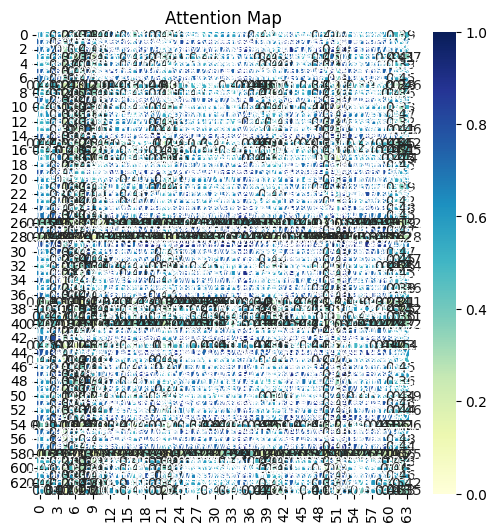

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.7875)

tensor(428.8963, grad_fn=<DivBackward1>)


 60%|██████    | 18/30 [5:02:10<3:25:13, 1026.09s/it]

Complete 17 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9872, 0.8870, 0.9195,  ..., 0.9726, 0.9753, 0.9997],
         [0.9864, 0.8849, 0.9213,  ..., 0.9737, 0.9763, 0.9998],
         [0.9384, 0.7905, 0.9774,  ..., 0.9992, 0.9996, 0.9853],
         ...,
         [0.8157, 0.9533, 0.4817,  ..., 0.5854, 0.5927, 0.7128],
         [1.0000, 0.9451, 0.8534,  ..., 0.9270, 0.9313, 0.9844],
         [0.9142, 0.7533, 0.9893,  ..., 0.9996, 0.9992, 0.9718]],

        [[0.5251, 0.8159, 0.9586,  ..., 0.9348, 0.8291, 0.9421],
         [0.7961, 0.9842, 0.9858,  ..., 0.9957, 0.9885, 0.9935],
         [0.6792, 0.9294, 0.9994,  ..., 0.9938, 0.9383, 0.9960],
         ...,
         [0.6204, 0.8911, 0.9912,  ..., 0.9783, 0.9019, 0.9826],
         [0.5749, 0.8572, 0.9786,  ..., 0.9604, 0.8693, 0.9661],
         [0.9533, 0.9826, 0.8667,  ..., 0.9003, 0.9775, 0.8911]],

        [[0.9995, 0.9644, 0.9996,  ..., 0.8719, 0.8881, 0.9809],
         [0.9886, 0.9268, 0.9892,  ..., 0.8125, 0.8312, 0.9509],
         [0.9459, 0.9955, 0.9447,  ..., 0.9873, 0.9

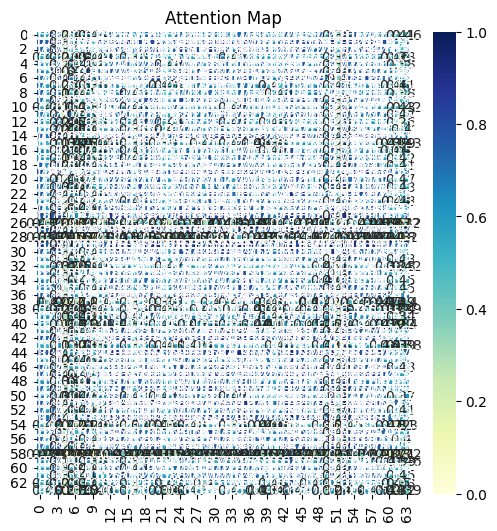

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.7750)

tensor(428.7975, grad_fn=<DivBackward1>)


 63%|██████▎   | 19/30 [5:18:35<3:05:51, 1013.80s/it]

Complete 18 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9940, 0.9231, 0.9771,  ..., 0.9988, 0.7405, 0.9819],
         [0.9851, 0.9932, 0.9977,  ..., 0.9729, 0.8860, 0.9958],
         [0.9332, 0.9967, 0.9650,  ..., 0.9104, 0.9580, 0.9587],
         ...,
         [0.9870, 0.9918, 0.9984,  ..., 0.9754, 0.8811, 0.9968],
         [0.7655, 0.9073, 0.8220,  ..., 0.7306, 0.9978, 0.8097],
         [0.9344, 0.9969, 0.9659,  ..., 0.9118, 0.9570, 0.9596]],

        [[0.9997, 0.7203, 0.9661,  ..., 0.8666, 0.9649, 0.9871],
         [0.9122, 0.9213, 0.9899,  ..., 0.9916, 0.9906, 0.8520],
         [0.9432, 0.8862, 0.9984,  ..., 0.9768, 0.9987, 0.8915],
         ...,
         [0.8740, 0.9518, 0.9732,  ..., 0.9992, 0.9743, 0.8062],
         [0.8420, 0.9699, 0.9559,  ..., 0.9996, 0.9572, 0.7695],
         [0.9903, 0.6229, 0.9134,  ..., 0.7838, 0.9116, 1.0000]],

        [[0.8905, 0.9278, 0.8865,  ..., 0.9304, 0.9950, 0.9587],
         [0.9812, 0.9950, 0.9794,  ..., 0.9957, 0.9827, 1.0000],
         [0.9477, 0.9731, 0.9447,  ..., 0.9748, 0.9

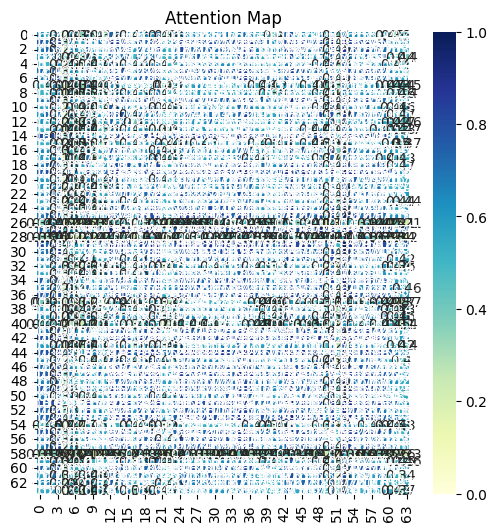

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8062)

tensor(427.6620, grad_fn=<DivBackward1>)


 67%|██████▋   | 20/30 [5:34:50<2:47:02, 1002.22s/it]

Complete 19 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.8367, 0.8854, 0.9787,  ..., 0.9992, 0.9720, 0.9577],
         [0.9596, 0.9834, 0.9948,  ..., 0.9641, 0.8604, 0.9999],
         [0.8893, 0.9302, 0.9955,  ..., 0.9973, 0.9402, 0.9837],
         ...,
         [0.9711, 0.9905, 0.9892,  ..., 0.9515, 0.8386, 0.9981],
         [0.9375, 0.8983, 0.7555,  ..., 0.6570, 0.4899, 0.8030],
         [0.8893, 0.9302, 0.9955,  ..., 0.9973, 0.9402, 0.9837]],

        [[0.9589, 0.8979, 0.9990,  ..., 0.9596, 0.9964, 0.9100],
         [0.7066, 0.9968, 0.8834,  ..., 0.7082, 0.8207, 0.6198],
         [0.8518, 0.9826, 0.9736,  ..., 0.8531, 0.9367, 0.7766],
         ...,
         [0.9942, 0.6897, 0.9063,  ..., 0.9939, 0.9522, 0.9993],
         [0.9203, 0.9418, 0.9974,  ..., 0.9213, 0.9796, 0.8585],
         [0.7312, 0.9993, 0.9013,  ..., 0.7328, 0.8420, 0.6453]],

        [[0.9993, 0.8988, 0.9993,  ..., 0.9802, 0.9548, 0.9986],
         [0.9999, 0.9199, 0.9999,  ..., 0.9684, 0.9381, 0.9944],
         [0.9950, 0.9486, 0.9952,  ..., 0.9449, 0.9

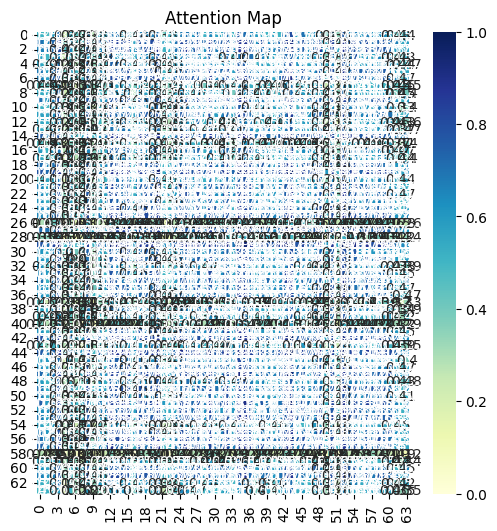

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8125)

tensor(427.4099, grad_fn=<DivBackward1>)


 70%|███████   | 21/30 [5:51:04<2:29:04, 993.81s/it] 

Complete 20 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9812, 0.8679, 0.7132,  ..., 0.9904, 0.9348, 0.7533],
         [0.7918, 0.9990, 0.9459,  ..., 0.9408, 0.9927, 0.9657],
         [0.9990, 0.7929, 0.6240,  ..., 0.9593, 0.8753, 0.6659],
         ...,
         [0.8305, 0.9931, 0.9203,  ..., 0.9628, 0.9989, 0.9445],
         [0.6729, 0.9868, 0.9920,  ..., 0.8567, 0.9476, 0.9983],
         [0.8476, 0.9885, 0.9070,  ..., 0.9714, 0.9999, 0.9330]],

        [[0.9767, 0.8878, 0.9993,  ..., 0.9931, 0.9193, 0.8084],
         [0.9578, 0.9188, 0.9937,  ..., 0.9814, 0.9458, 0.7669],
         [0.9624, 0.9125, 0.9954,  ..., 0.9844, 0.9404, 0.7760],
         ...,
         [0.9781, 0.8849, 0.9996,  ..., 0.9939, 0.9167, 0.8119],
         [0.5779, 0.9431, 0.6870,  ..., 0.6383, 0.9156, 0.3333],
         [0.7678, 0.9998, 0.8614,  ..., 0.8214, 0.9951, 0.5090]],

        [[0.3007, 0.4982, 0.7262,  ..., 0.8421, 0.6262, 0.4988],
         [0.7389, 0.9201, 0.9996,  ..., 0.9828, 0.9811, 0.9205],
         [0.7828, 0.9470, 0.9987,  ..., 0.9657, 0.9

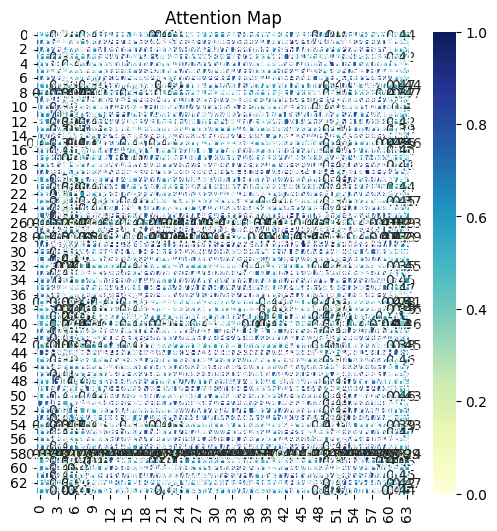

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8000)

tensor(427.8509, grad_fn=<DivBackward1>)


 73%|███████▎  | 22/30 [6:07:23<2:11:53, 989.17s/it]

Complete 21 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9899, 0.9996, 0.9956,  ..., 0.9464, 0.9821, 0.8100],
         [0.9844, 1.0000, 0.9918,  ..., 0.9350, 0.9880, 0.8281],
         [0.9876, 0.9999, 0.9941,  ..., 0.9415, 0.9848, 0.8181],
         ...,
         [0.9916, 0.9991, 0.9967,  ..., 0.9502, 0.9797, 0.8036],
         [0.9487, 0.9885, 0.9627,  ..., 0.8762, 1.0000, 0.8967],
         [0.8236, 0.9034, 0.8479,  ..., 0.7189, 0.9587, 0.9859]],

        [[0.5856, 0.9229, 0.7588,  ..., 0.7995, 0.9564, 0.7734],
         [0.9937, 0.8727, 0.9840,  ..., 0.9684, 0.8232, 0.9791],
         [0.9998, 0.8277, 0.9635,  ..., 0.9417, 0.7733, 0.9564],
         ...,
         [0.6502, 0.9577, 0.8167,  ..., 0.8537, 0.9818, 0.8301],
         [0.9972, 0.8555, 0.9769,  ..., 0.9587, 0.8038, 0.9710],
         [0.9951, 0.8669, 0.9817,  ..., 0.9652, 0.8166, 0.9765]],

        [[0.9870, 0.9869, 0.9813,  ..., 0.9393, 0.9234, 0.9601],
         [0.9724, 0.9722, 0.9929,  ..., 0.9619, 0.9488, 0.9781],
         [0.9960, 0.9959, 0.9652,  ..., 0.9132, 0.8

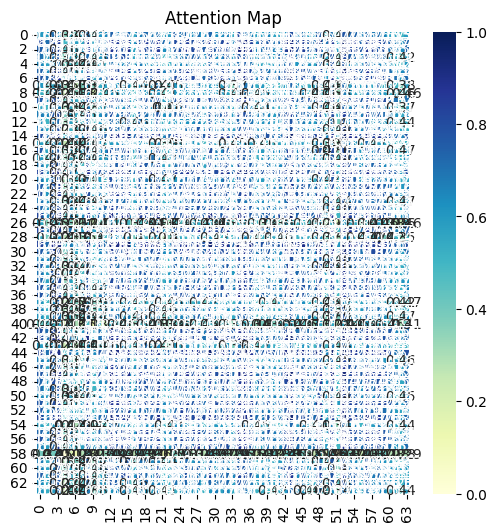

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8062)

tensor(427.4929, grad_fn=<DivBackward1>)


 77%|███████▋  | 23/30 [6:23:36<1:54:51, 984.45s/it]

Complete 22 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9045, 0.9298, 0.8762,  ..., 0.9484, 0.9878, 0.8302],
         [0.8804, 0.8494, 0.9083,  ..., 0.8214, 0.7285, 0.9430],
         [0.9495, 0.9273, 0.9678,  ..., 0.9060, 0.8287, 0.9873],
         ...,
         [0.9722, 0.9855, 0.9550,  ..., 0.9934, 0.9986, 0.9234],
         [0.9521, 0.9700, 0.9305,  ..., 0.9820, 0.9998, 0.8932],
         [0.9970, 0.9999, 0.9897,  ..., 0.9990, 0.9775, 0.9716]],

        [[0.9948, 0.9340, 0.9668,  ..., 0.9891, 0.9628, 0.7904],
         [0.9526, 0.8454, 0.9987,  ..., 0.9378, 0.8888, 0.6695],
         [0.9899, 0.9922, 0.8806,  ..., 0.9954, 0.9995, 0.9071],
         ...,
         [0.9888, 0.9164, 0.9778,  ..., 0.9808, 0.9489, 0.7638],
         [0.9768, 0.8894, 0.9895,  ..., 0.9660, 0.9267, 0.7258],
         [0.9898, 0.9923, 0.8801,  ..., 0.9953, 0.9995, 0.9075]],

        [[0.9165, 0.7777, 0.9178,  ..., 0.9794, 0.7383, 0.9976],
         [0.9402, 0.8134, 0.9414,  ..., 0.9641, 0.7759, 0.9909],
         [0.9989, 0.9444, 0.9991,  ..., 0.8477, 0.9

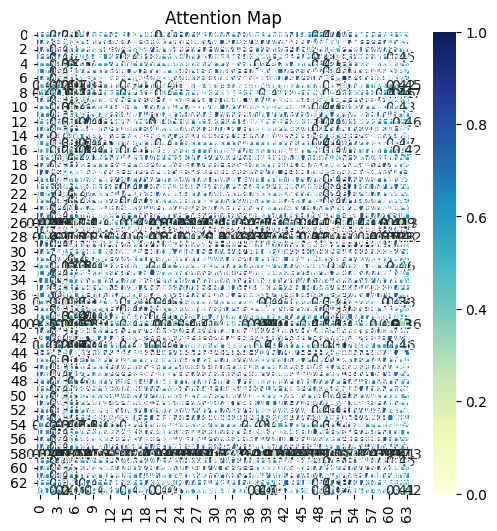

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8375)

tensor(426.7390, grad_fn=<DivBackward1>)


 80%|████████  | 24/30 [6:40:16<1:38:53, 988.99s/it]

Complete 23 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9891, 0.8803, 0.9990,  ..., 0.9935, 0.9362, 0.6247],
         [0.9204, 0.7468, 0.9771,  ..., 0.9327, 0.8241, 0.4699],
         [0.9568, 0.8075, 0.9945,  ..., 0.9659, 0.8772, 0.5347],
         ...,
         [0.9866, 0.8729, 0.9996,  ..., 0.9915, 0.9306, 0.6148],
         [0.9686, 0.9946, 0.9058,  ..., 0.9598, 0.9993, 0.8504],
         [0.9451, 0.7866, 0.9897,  ..., 0.9553, 0.8592, 0.5115]],

        [[0.9446, 0.9402, 0.9428,  ..., 0.9318, 0.9244, 0.9543],
         [0.9412, 0.9436, 0.9462,  ..., 0.9355, 0.9282, 0.9573],
         [0.8362, 0.9959, 0.9966,  ..., 0.9934, 0.9908, 0.9990],
         ...,
         [0.7635, 0.9990, 0.9986,  ..., 0.9998, 1.0000, 0.9959],
         [0.6917, 0.9857, 0.9844,  ..., 0.9895, 0.9923, 0.9772],
         [0.9835, 0.8797, 0.8832,  ..., 0.8686, 0.8589, 0.8992]],

        [[0.6036, 0.9794, 0.9995,  ..., 0.6115, 0.9251, 0.8249],
         [0.9576, 0.8797, 0.7947,  ..., 0.9612, 0.9514, 0.9960],
         [0.9769, 0.8430, 0.7513,  ..., 0.9796, 0.9

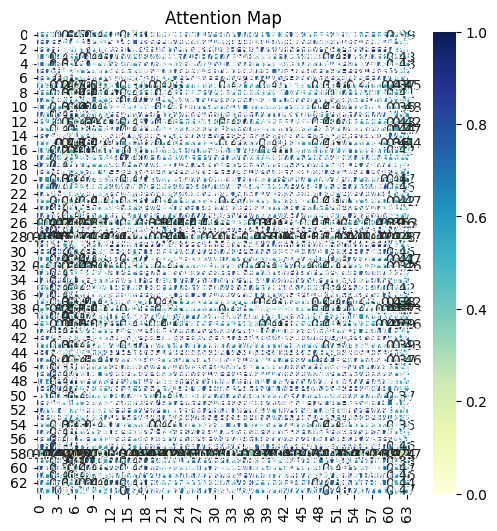

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8125)

tensor(426.8050, grad_fn=<DivBackward1>)


 83%|████████▎ | 25/30 [6:56:34<1:22:08, 985.62s/it]

Complete 24 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.8494, 0.8837, 0.7211,  ..., 0.6152, 0.6434, 0.7515],
         [0.9985, 0.9917, 0.9836,  ..., 0.9376, 0.9524, 0.9917],
         [0.9989, 0.9928, 0.9819,  ..., 0.9345, 0.9496, 0.9905],
         ...,
         [0.9920, 0.9800, 0.9939,  ..., 0.9596, 0.9714, 0.9983],
         [0.9841, 0.9685, 0.9983,  ..., 0.9727, 0.9824, 1.0000],
         [0.9795, 0.9916, 0.9073,  ..., 0.8261, 0.8494, 0.9274]],

        [[0.5207, 0.7476, 0.9162,  ..., 0.9760, 0.9985, 0.9469],
         [0.7972, 0.9578, 0.9987,  ..., 0.9695, 0.8714, 0.9904],
         [0.4466, 0.6730, 0.8617,  ..., 0.9414, 0.9974, 0.9007],
         ...,
         [0.7622, 0.9382, 0.9999,  ..., 0.9830, 0.8992, 0.9972],
         [0.6610, 0.8689, 0.9829,  ..., 0.9999, 0.9593, 0.9952],
         [0.7214, 0.9123, 0.9965,  ..., 0.9935, 0.9268, 1.0000]],

        [[0.6445, 0.6427, 0.8778,  ..., 0.9373, 0.9908, 0.6435],
         [0.7445, 0.7429, 0.9434,  ..., 0.9820, 0.9995, 0.7436],
         [0.9591, 0.9583, 0.9906,  ..., 0.9593, 0.8

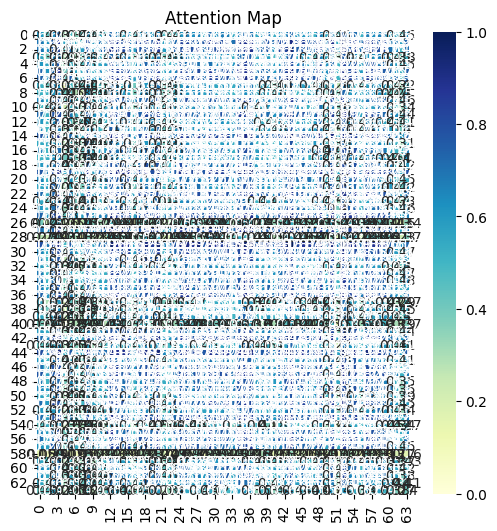

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.7937)

tensor(426.9360, grad_fn=<DivBackward1>)


 87%|████████▋ | 26/30 [7:12:13<1:04:46, 971.71s/it]

Complete 25 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9460, 0.9648, 0.7031,  ..., 0.9344, 0.7766, 0.8809],
         [0.9912, 0.9805, 0.9328,  ..., 0.9952, 0.9705, 0.9993],
         [0.9999, 0.9971, 0.8845,  ..., 0.9997, 0.9348, 0.9873],
         ...,
         [0.9845, 0.9711, 0.9471,  ..., 0.9900, 0.9800, 1.0000],
         [0.9999, 0.9970, 0.8847,  ..., 0.9997, 0.9350, 0.9874],
         [0.9971, 0.9999, 0.8437,  ..., 0.9938, 0.9018, 0.9699]],

        [[0.9883, 0.9860, 1.0000,  ..., 0.9619, 0.9878, 0.9818],
         [0.9738, 0.9770, 0.9311,  ..., 0.9945, 0.8642, 0.9817],
         [0.9997, 1.0000, 0.9855,  ..., 0.9948, 0.9459, 0.9999],
         ...,
         [0.9889, 0.9867, 1.0000,  ..., 0.9629, 0.9872, 0.9825],
         [0.9981, 0.9971, 0.9964,  ..., 0.9825, 0.9698, 0.9950],
         [0.9709, 0.9742, 0.9266,  ..., 0.9931, 0.8582, 0.9792]],

        [[0.9995, 0.8548, 0.8472,  ..., 0.9681, 0.9993, 0.9681],
         [0.9609, 0.6819, 0.9665,  ..., 0.9982, 0.9394, 0.8504],
         [0.9991, 0.8593, 0.8426,  ..., 0.9658, 0.9

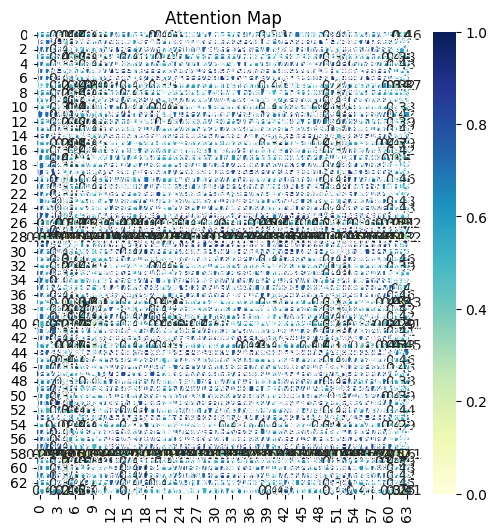

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8188)

tensor(426.5563, grad_fn=<DivBackward1>)


 90%|█████████ | 27/30 [7:27:52<48:06, 962.08s/it]  

Complete 26 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.6896, 0.8676, 0.9815,  ..., 0.9968, 0.8858, 0.9554],
         [0.8905, 0.9885, 0.9826,  ..., 0.9560, 0.9938, 0.9969],
         [0.9631, 0.9985, 0.9251,  ..., 0.8792, 0.9955, 0.9600],
         ...,
         [0.6481, 0.8342, 0.9661,  ..., 0.9889, 0.8540, 0.9334],
         [0.9641, 0.9983, 0.9236,  ..., 0.8774, 0.9951, 0.9589],
         [0.9404, 0.9998, 0.9506,  ..., 0.9112, 0.9998, 0.9783]],

        [[0.7861, 0.6802, 0.9502,  ..., 0.8622, 0.7998, 0.7459],
         [0.8330, 0.7328, 0.9739,  ..., 0.9016, 0.8457, 0.7956],
         [0.8990, 0.8120, 0.9962,  ..., 0.9525, 0.9094, 0.8675],
         ...,
         [0.9011, 0.8146, 0.9966,  ..., 0.9539, 0.9113, 0.8698],
         [0.9453, 0.8738, 0.9992,  ..., 0.9828, 0.9531, 0.9204],
         [0.8622, 0.9371, 0.6556,  ..., 0.7861, 0.8500, 0.8943]],

        [[0.8608, 0.9145, 0.9773,  ..., 0.7916, 0.9933, 0.9739],
         [0.8290, 0.8880, 0.9618,  ..., 0.7557, 0.9837, 0.9865],
         [0.9886, 0.9626, 0.8892,  ..., 0.9999, 0.8

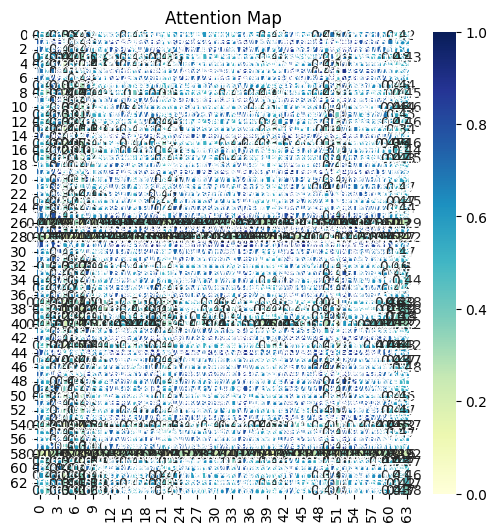

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8438)

tensor(426.0812, grad_fn=<DivBackward1>)


 93%|█████████▎| 28/30 [7:43:32<31:50, 955.43s/it]

Complete 27 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9310, 0.8425, 0.9986,  ..., 0.9374, 0.9785, 1.0000],
         [0.9635, 0.8912, 0.9876,  ..., 0.8975, 0.9947, 0.9949],
         [0.9860, 0.9320, 0.9661,  ..., 0.8502, 1.0000, 0.9789],
         ...,
         [0.9986, 0.9666, 0.9312,  ..., 0.7911, 0.9933, 0.9497],
         [0.9610, 0.8872, 0.9890,  ..., 0.9013, 0.9937, 0.9957],
         [0.9996, 0.9725, 0.9225,  ..., 0.7778, 0.9902, 0.9421]],

        [[0.9116, 0.4738, 0.7196,  ..., 0.5067, 0.4468, 0.5873],
         [0.9051, 0.9420, 0.9979,  ..., 0.9590, 0.9258, 0.9880],
         [0.8726, 0.9642, 0.9901,  ..., 0.9774, 0.9509, 0.9968],
         ...,
         [0.9781, 0.8443, 0.9855,  ..., 0.8710, 0.8205, 0.9263],
         [0.9324, 0.9163, 1.0000,  ..., 0.9367, 0.8975, 0.9745],
         [0.9549, 0.8875, 0.9970,  ..., 0.9108, 0.8664, 0.9566]],

        [[0.6397, 0.6277, 0.8025,  ..., 0.8990, 0.9063, 0.9312],
         [0.9526, 0.9466, 0.9996,  ..., 0.9853, 0.9821, 0.9677],
         [0.6247, 0.6126, 0.7892,  ..., 0.8885, 0.8

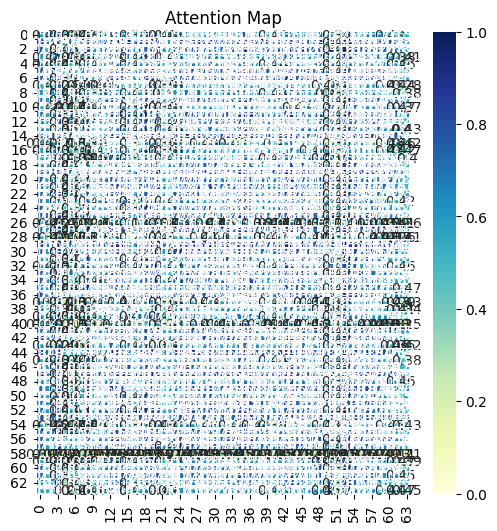

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8188)

tensor(426.3332, grad_fn=<DivBackward1>)


 97%|█████████▋| 29/30 [7:59:10<15:50, 950.25s/it]

Complete 28 th
torch.Size([160, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9990, 0.9806, 0.8665,  ..., 0.9489, 0.9524, 0.9104],
         [0.5959, 0.5033, 0.9084,  ..., 0.8096, 0.8036, 0.8641],
         [0.7766, 0.6876, 0.9913,  ..., 0.9427, 0.9390, 0.9730],
         ...,
         [0.8471, 0.7659, 1.0000,  ..., 0.9785, 0.9761, 0.9951],
         [0.9957, 0.9700, 0.8883,  ..., 0.9629, 0.9658, 0.9287],
         [0.7201, 0.6279, 0.9736,  ..., 0.9066, 0.9020, 0.9459]],

        [[0.9971, 0.9992, 0.8167,  ..., 0.9991, 0.9120, 0.9260],
         [0.9928, 1.0000, 0.7931,  ..., 1.0000, 0.9287, 0.9091],
         [0.9693, 0.9354, 0.9528,  ..., 0.9348, 0.7522, 0.9978],
         ...,
         [0.8922, 0.9367, 0.5834,  ..., 0.9372, 0.9996, 0.7297],
         [0.9993, 0.9970, 0.8360,  ..., 0.9968, 0.8967, 0.9392],
         [0.8923, 0.9367, 0.5836,  ..., 0.9373, 0.9996, 0.7298]],

        [[0.8645, 0.9998, 0.8441,  ..., 0.9564, 0.8316, 0.8661],
         [0.9975, 0.9049, 0.9936,  ..., 0.9856, 0.9905, 0.9977],
         [0.8578, 0.9994, 0.8371,  ..., 0.9523, 0.8

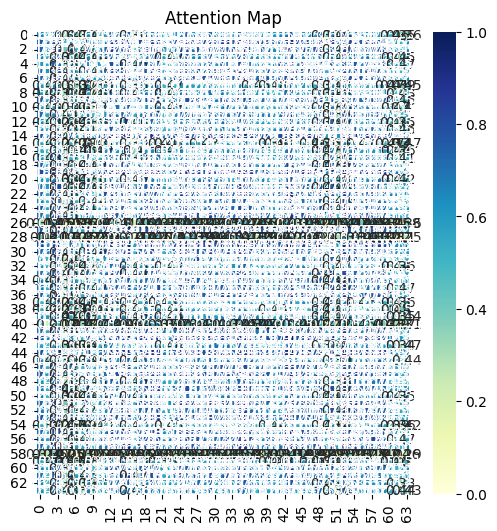

Q_output size: torch.Size([64, 160, 64])
K_output size: torch.Size([64, 160, 64])
V_output size: torch.Size([160, 64, 16])


/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.8188)

tensor(426.1120, grad_fn=<DivBackward1>)


100%|██████████| 30/30 [8:14:51<00:00, 989.70s/it]

Complete 29 th


In [64]:
for iepoch in tqdm(range(30)):
    optimizer.zero_grad()
    X_tensor=torch.tensor(X_train)
    predictions=model(X_tensor.float()).squeeze(1)
    #predictions=torch.sign(predictions)
    #print(predictions)
    label=torch.tensor(y_train)
    for i in range(len(label)):
        if label[i]==1:
            label[i] = 0
        else:
            label[i]=1
    #print(label)
    loss = criterion(predictions, label.float())
    acc = binary_accuracy(predictions, label)
    print('')
    print('Accuracy:',acc)
    print('')
    print(loss)
    loss.backward()
    optimizer.step()
    print("Complete "+str(iepoch)+" th")

torch.Size([40, 64, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9961, 0.9510, 0.9972,  ..., 0.9650, 0.9892, 0.9123],
         [0.9883, 0.9689, 1.0000,  ..., 0.9799, 0.9967, 0.9363],
         [0.9871, 0.9707, 1.0000,  ..., 0.9813, 0.9972, 0.9387],
         ...,
         [1.0000, 0.9182, 0.9854,  ..., 0.9362, 0.9708, 0.8714],
         [0.9772, 0.8253, 0.9310,  ..., 0.8502, 0.9037, 0.7654],
         [1.0000, 0.9206, 0.9865,  ..., 0.9383, 0.9723, 0.8743]],

        [[0.9707, 0.9320, 0.9998,  ..., 0.9906, 0.9935, 0.9938],
         [0.9876, 0.9590, 0.9978,  ..., 0.9754, 0.9996, 0.9807],
         [0.9993, 0.9860, 0.9823,  ..., 0.9422, 0.9957, 0.9503],
         ...,
         [0.9972, 0.9790, 0.9887,  ..., 0.9540, 0.9985, 0.9613],
         [0.9355, 0.8840, 0.9902,  ..., 0.9999, 0.9727, 1.0000],
         [0.9197, 0.8641, 0.9832,  ..., 0.9996, 0.9617, 0.9986]],

        [[1.0000, 0.8590, 0.9775,  ..., 0.9626, 0.8837, 0.8231],
         [0.9983, 0.8299, 0.9634,  ..., 0.9453, 0.8565, 0.7917],
         [0.9967, 0.8182, 0.9572,  ..., 0.9378, 0.8

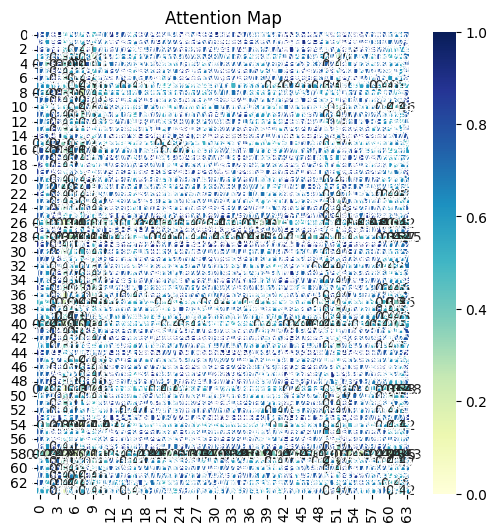

Q_output size: torch.Size([64, 40, 64])
K_output size: torch.Size([64, 40, 64])
V_output size: torch.Size([40, 64, 16])

Accuracy: 0.7749999761581421

Loss: 45.262664794921875

AUROC: 0.8490028490028491



/tmp/ipykernel_48685/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


In [65]:
from sklearn.metrics import roc_auc_score

X_tensor=torch.tensor(X_test)
predictions=model(X_tensor.float()).squeeze(1)
label=torch.tensor(y_test)
for i in range(len(label)):
        if label[i]==1:
            label[i] = 0
        else:
            label[i]=1
loss = criterion(predictions, label.float())
acc = binary_accuracy(predictions, label.float())

# Calculate AUROC
preds_np = predictions.detach().numpy()  # Detach predictions from the graph and convert to numpy
labels_np = label.numpy()  # Convert labels to numpy
auroc = roc_auc_score(labels_np, preds_np)

# Print results
print(f'\nAccuracy: {acc}\n')
print(f'Loss: {loss}\n')
print(f'AUROC: {auroc}\n')

-----------------------------------------